### 참고 사이트 

+ http://matplotlib.org
+ http://seaborn.pydata.org

### 기본 그래프 

- 선그래프(line), 막대그래프(bar), 히스토그램(histogram), 산포도(scatter), 상자(boxplot)

#### 1) 질적 데이터
        - 요약 방법 : 도표
        - 정리 방법 : 도수분포표, 분할표 (빈도수로 정리)
        - 그래프 : 막대 그래프, 원 그래프,......
#### 2) 양적 데이터
        - 요약 방법 : 숫자
        - 정리 방법 : 산술평균, 중앙값,......
        - 그래프 : 히스토그램, Boxplot, 시계열(선) 그래프, 산포도(산점도)

In [21]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt 
import seaborn as sns

#폰트 지정
import matplotlib.font_manager as fm
font_name=fm.FontProperties(fname="C:/Windows/Fonts/malgun.ttf").get_name()
plt.rc('font', family=font_name)

mpl.rcParams["axes.unicode_minus"] = False

### 선 그래프

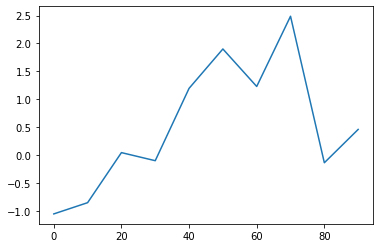

In [16]:
#s  = pd.Series(np.random.randn(10), index=np.arange(0,100,10))
s  = pd.Series(np.random.randn(10).cumsum(), index=np.arange(0,100,10)) # 누적의 합 cumsum()
s
s.plot() #X 축이 인덱스 / Y 축이 데이터 
#s.plot.line()


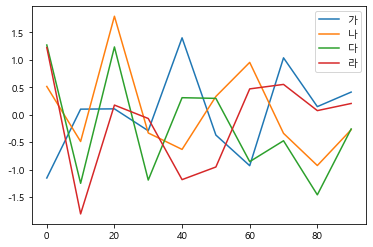

In [29]:
df1 = pd.DataFrame(np.random.randn(10,4), columns=["가","나","다","라"], index=np.arange(0,100,10))
df1
df1.plot()

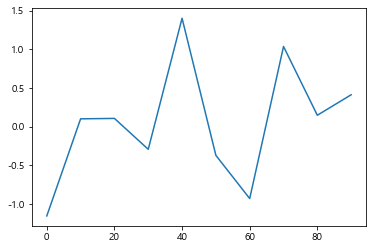

In [31]:
df1["가"].plot() # 하나만 뽑아서 봅고 싶을 때 

---
### 막대그래프

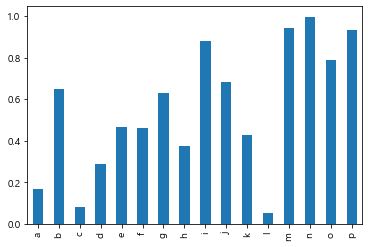

In [37]:
s2 = pd.Series(np.random.rand(16), index=list("abcdefghijklmnop")) 
s2
s2.plot(kind="bar")
#s2.plot.bar()

<bound method PlotAccessor.barh of <pandas.plotting._core.PlotAccessor object at 0x0000022E7D9B5040>>

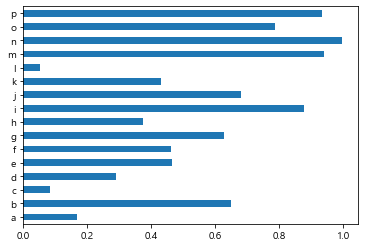

In [39]:
s2.plot(kind="barh")
s2.plot.barh             

In [41]:
df2 = pd.DataFrame(np.random.rand(6,4), index=["one","two","three","four","five","six"], columns=pd.Index(["A","B","C","D"],
                                                                                                         name="Genus"))
df2

Genus,A,B,C,D
one,0.628158,0.240375,0.285591,0.616893
two,0.183493,0.151449,0.527303,0.504870
three,0.690737,0.498715,0.174349,0.138691
four,0.177265,0.826383,0.902557,0.270809
five,0.091084,0.360844,0.876094,0.797328
six,0.398065,0.067993,0.598494,0.147541


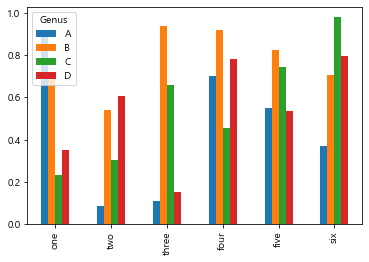

In [2]:
df2 = pd.DataFrame(np.random.rand(6,4), index=["one","two","three","four","five","six"], columns=pd.Index(["A","B","C","D"],
                                                                                                         name="Genus"))
df2
df2.plot(kind="bar")

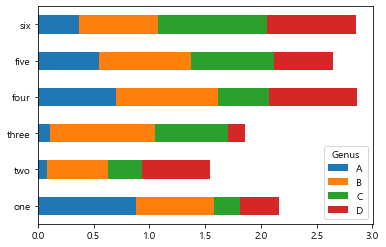

In [4]:
df2.plot(kind="barh", stacked=True)

### 히스토그램

+ X변수가 가질 수 있는 값의 범위만 필요
+ 값만 필요하고 인덱스는 필요 없다.

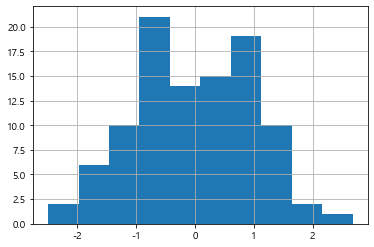

In [6]:
s=pd.Series(np.random.normal(0, 1, size=100))
s
s.hist() #기본적으로 막대 10개로 나타낸다.

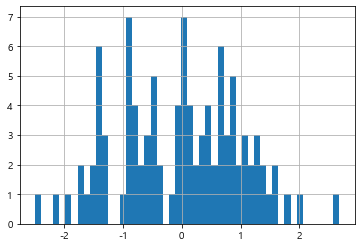

In [7]:
s.hist(bins=50)

### 산포도  (Scatter plot)

+ 두 변수의 관계를 확인:양, 음



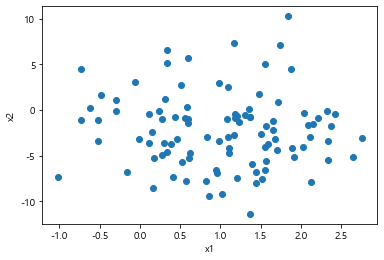

In [17]:
x1 = np.random.normal(1, 1, size=(100,1))
x1
x2 = np.random.normal(-2, 4, size=(100,1))
x2
x=np.concatenate((x1, x2), axis=1)
x
df=pd.DataFrame(x, columns=["x1","x2"])
df

df.plot.scatter("x1", "x2")
plt.scatter(df["x1"],df["x2"])

### 상자그래프(Box plot)

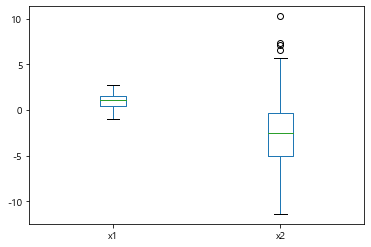

In [18]:
df.plot.box()

### matplotlib을 이용한 그래프 그리기

In [2]:
# 데이터 준비
tips = sns.load_dataset("tips")
tips.head()

NameError: name 'sns' is not defined

Text(0, 0.5, 'Total Bill')

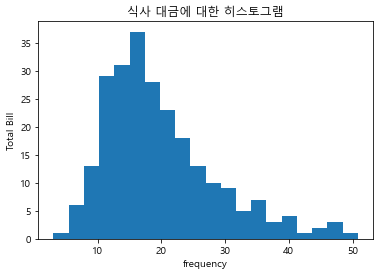

In [23]:
fig = plt.figure() #그래프를 그릴수 있게 만드는 장소 생성
ax = fig.add_subplot(1, 1, 1) 

# total_bill에 대한 금액 분포를 확인 (변수 하나에 양적데이터)
ax.hist(tips["total_bill"], bins=20)
ax.set_title("식사 대금에 대한 히스토그램")
ax.set_xlabel("frequency")
ax.set_ylabel("Total Bill")







Text(0, 0.5, 'Tip')

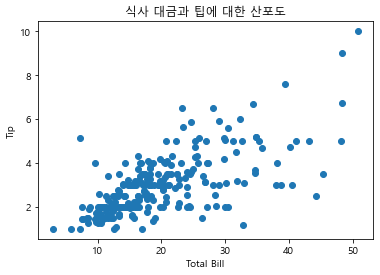

In [25]:
# tip 과 total_bill 의 관계를 알고 싶다.
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1) 

ax.scatter(tips["total_bill"], tips["tip"])
ax.set_title("식사 대금과 팁에 대한 산포도")
ax.set_xlabel("Total Bill")
ax.set_ylabel("Tip")

Text(0, 0.5, 'Tip')

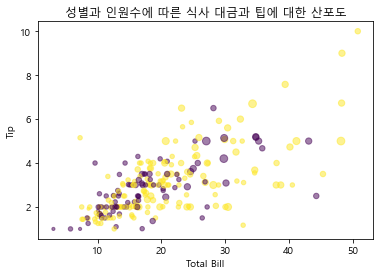

In [32]:
# 성별에 따른 tip과 total_bill 의 관계를 알고 싶다.

def record_sex(sex):
    if sex=="Female":
        return 0
    else:
        return 1
tips["sex_color"] = tips["sex"].apply(record_sex)
tips.head()

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1) 

ax.scatter(tips["total_bill"], tips["tip"], c=tips["sex_color"], s=tips["size"]*10, alpha= 0.5)  
#c는 숫자만 받는다 /  s는 원의 크기 / alpha는 투명도 

ax.set_title("성별과 인원수에 따른 식사 대금과 팁에 대한 산포도")
ax.set_xlabel("Total Bill")
ax.set_ylabel("Tip")


Text(0.5, 1.0, '성별에 따른팁에 대한 box plot')

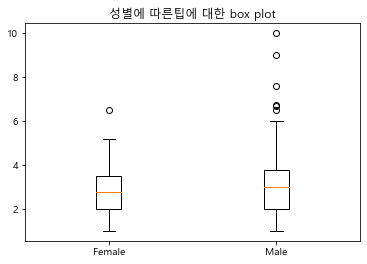

In [34]:
# 성별과 팁의 관계

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1) 

ax.boxplot([tips[tips["sex"]=="Female"]["tip"],  tips[tips["sex"]=="Male"]["tip"]], labels=["Female","Male"])

ax.set_title("성별에 따른팁에 대한 box plot")



---
### seaborn

In [35]:
tips = sns.load_dataset("tips")

Text(0, 0.5, 'Total Bill')

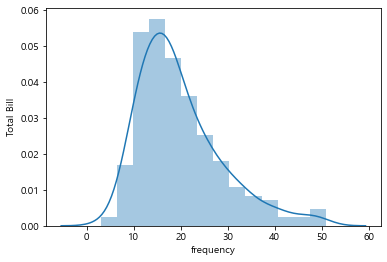

In [46]:

ax = plt.subplot(1, 1, 1) 
ax = sns.distplot(tips["total_bill"])
ax.set_xlabel("frequency")
ax.set_ylabel("Total Bill")


Text(0, 0.5, 'Total Bill')

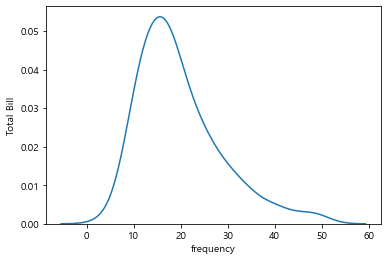

In [44]:
ax = plt.subplot(1, 1, 1) 
ax = sns.distplot(tips["total_bill"], hist=False)
ax.set_xlabel("frequency")
ax.set_ylabel("Total Bill")

Text(0, 0.5, 'Total Bill')

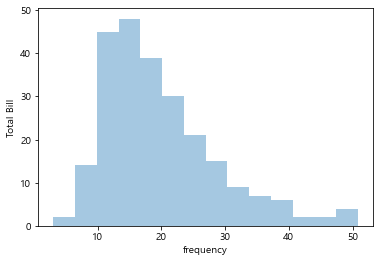

In [45]:
ax = plt.subplot(1, 1, 1) 
ax = sns.distplot(tips["total_bill"], kde=False) #비모수 추정박식을 꺼버리곘다. # kerner density estimation
ax.set_xlabel("frequency")
ax.set_ylabel("Total Bill")

Text(0, 0.5, 'Total Bill')

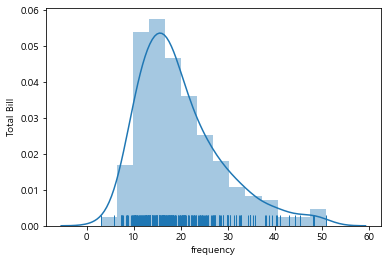

In [47]:
ax = plt.subplot(1, 1, 1) 
ax = sns.distplot(tips["total_bill"], rug=True)
ax.set_xlabel("frequency")
ax.set_ylabel("Total Bill")


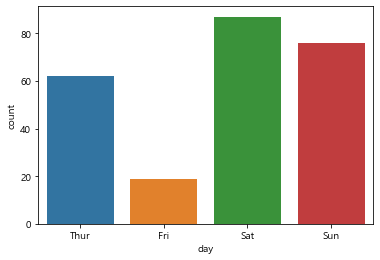

In [48]:
sns.countplot("day", data=tips)

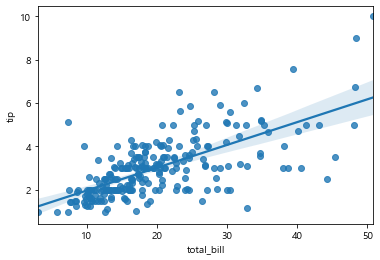

In [49]:
sns.regplot(x="total_bill",y="tip",data=tips)


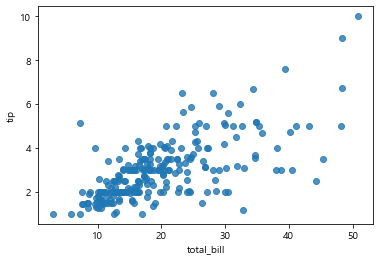

In [51]:
sns.regplot(x="total_bill",y="tip",data=tips, fit_reg=False)

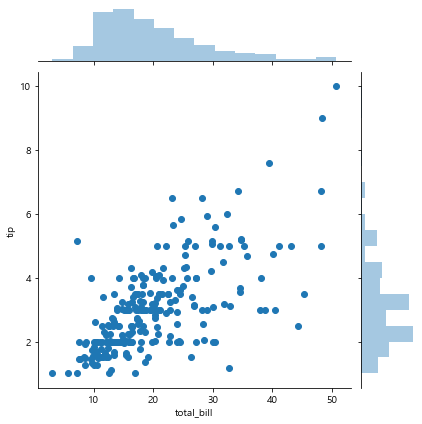

In [52]:
sns.jointplot(x="total_bill",y="tip",data=tips)

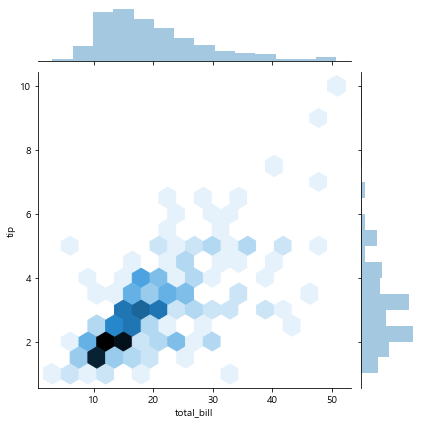

In [53]:
sns.jointplot(x="total_bill",y="tip",data=tips,kind="hex")

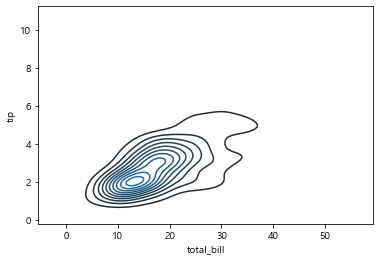

In [55]:
sns.kdeplot(data=tips["total_bill"], data2=tips["tip"])

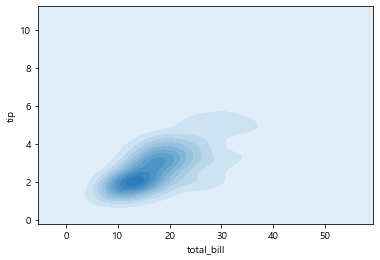

In [56]:
sns.kdeplot(data=tips["total_bill"], data2=tips["tip"], shade=True)

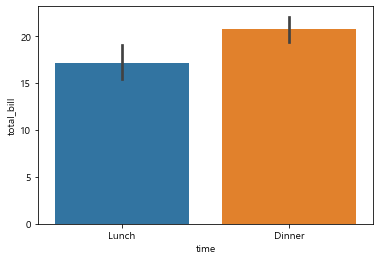

In [57]:
sns.barplot(x="time", y="total_bill", data=tips)

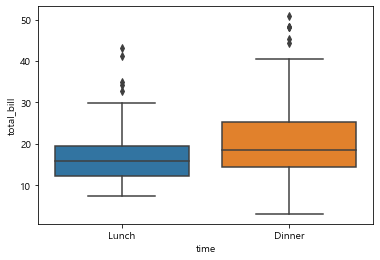

In [58]:
sns.boxplot(x="time", y="total_bill", data=tips)

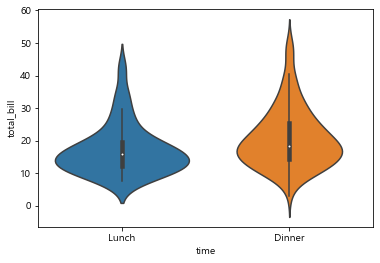

In [59]:
sns.violinplot(x="time", y="total_bill", data=tips)

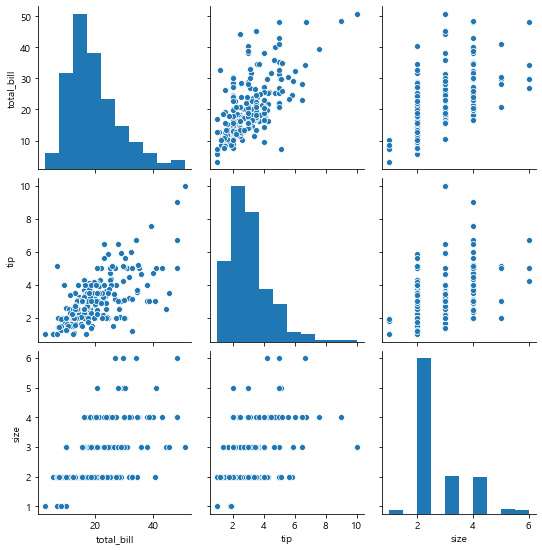

In [60]:
sns.pairplot(tips)

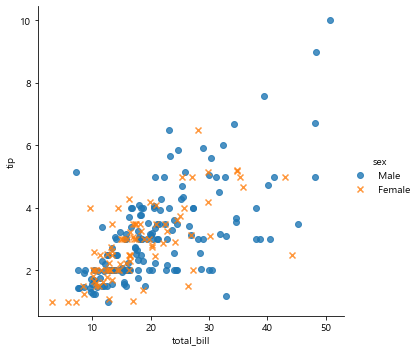

In [80]:
# 성별로 전체 식사대금과 팁의 관계를 확인

#hue 색상별로 데이터를 구분 / scatter_kws 점과 관련된 다양한 옵션
sns.lmplot(x="total_bill", y="tip", data=tips, fit_reg=False, hue="sex", markers=["o","x"])

In [102]:
#sns.lmplot(x="total_bill", y="tip", data=tips, fit_reg=False, hue="sex", scatter_kws=tips["size"]*10, markers=["o","x"])

---
### 지도 시각화 

+ pip install folium

In [103]:
!pip install folium

In [104]:
import folium

In [113]:
map = folium.Map(location=[37.49929487138454, 127.03315668722566])
map = folium.Map(location=[37.49929487138454, 127.03315668722566], zoom_start=15)
map = folium.Map(location=[37.49929487138454, 127.03315668722566], zoom_start=15, tiles="Stamen Toner")
map

In [114]:
state_unemp=pd.read_csv("data/map/folium_US_Unemployment_Oct2012.csv")
state_unemp.head()
#미국 주별 실업률 
#위도 경도 데이터를 json형식으로 

,State,Unemployment
0,AL,7.1
1,AK,6.8
2,AZ,8.1
3,AR,7.2
4,CA,10.1


In [121]:
state_geo = "data/map/folium_us-states.json"

map = folium.Map(location=[40, -98],zoom_start=4)
map.choropleth(geo_data=state_geo, data=state_unemp, key_on="feature.id", columns=["State","Unemployment"], fill_color="YlGn")
map

In [133]:
#Marker 
map = folium.Map(location=[37.49929487138454, 127.03315668722566], zoom_start=15)
map

#marker = folium.Marker(location=[37.49929487138454, 127.03315668722566], icon=folium.Icon(color="red", icon="star"))
#marker.add_to(map)
folium.Marker(location=[37.49929487138454, 127.03315668722566], popup="역삼역 근처", icon=folium.Icon(color="red", icon="star")).add_to(map)
map

#map.save("data/map/map.html")
folium.CircleMarker(location=[37.49929487138454, 127.03315668722566], popup="역삼역 근처", radius=50, color="#ffffgg",
                   fill_color="#fffggg").add_to(map)
map


 ---
 ### WordCloud
 + pip install wordcloud

In [134]:
!pip install wordcloud

In [17]:
from wordcloud import WordCloud, STOPWORDS

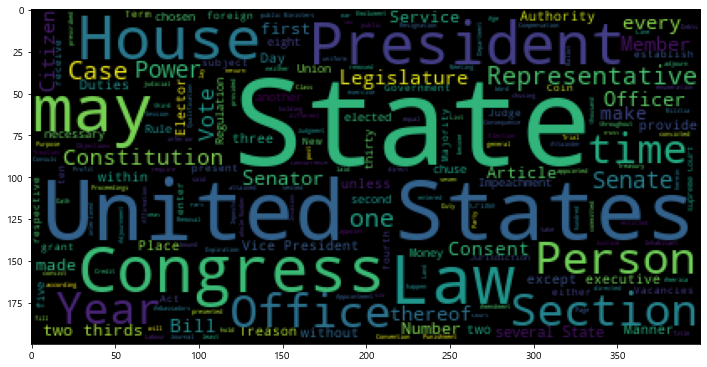

In [144]:
text=open("data/wordcloud/constitution.txt")
text=text.read()
text

wordcloud = WordCloud().generate(text)
#dir(wordcloud)
wordcloud.words_

plt.figure(figsize=(12, 12))
plt.imshow(wordcloud)

(-0.5, 399.5, 199.5, -0.5)

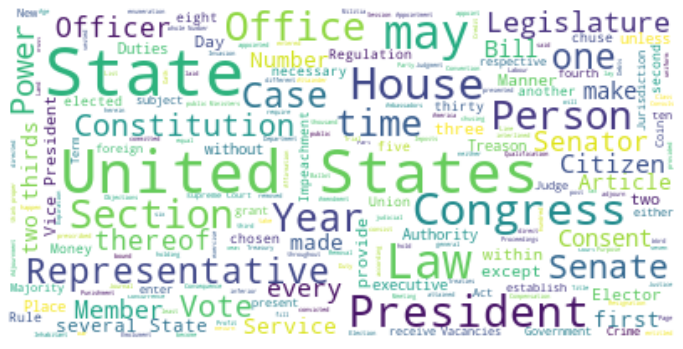

In [148]:
wordcloud = WordCloud(max_font_size=40, background_color="white").generate(text)
plt.figure(figsize=(12, 12))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off") # 축 삭제

In [16]:
from PIL import Image

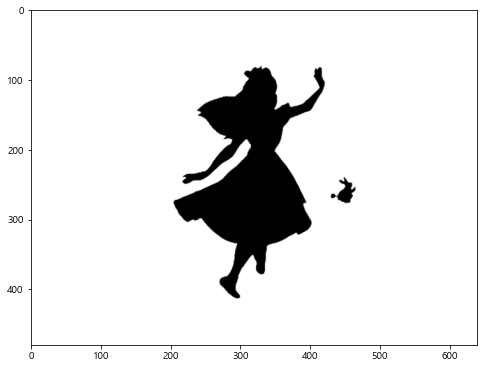

In [154]:
alice_mask = np.array(Image.open("data/wordcloud/alice_mask.png"))
alice_mask

plt.figure(figsize=(8, 8))
plt.imshow(alice_mask)

In [165]:
text = open("data/wordcloud/alice.txt").read()
text
stopwords = set(STOPWORDS)
stopwords.add("said")

wordcloud = WordCloud(max_font_size=40, background_color="white", mask=alice_mask, stopwords=stopwords,max_words=500).generate(text)
plt.figure(figsize=(12, 12))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")

(-0.5, 639.5, 479.5, -0.5)

In [158]:
STOPWORDS # set 자료형

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'all',
 'also',
 'am',
 'an',
 'and',
 'any',
 'are',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 "can't",
 'cannot',
 'com',
 'could',
 "couldn't",
 'did',
 "didn't",
 'do',
 'does',
 "doesn't",
 'doing',
 "don't",
 'down',
 'during',
 'each',
 'else',
 'ever',
 'few',
 'for',
 'from',
 'further',
 'get',
 'had',
 "hadn't",
 'has',
 "hasn't",
 'have',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 "he's",
 'hence',
 'her',
 'here',
 "here's",
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 "how's",
 'however',
 'http',
 'i',
 "i'd",
 "i'll",
 "i'm",
 "i've",
 'if',
 'in',
 'into',
 'is',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'k',
 "let's",
 'like',
 'me',
 'more',
 'most',
 "mustn't",
 'my',
 'myself',
 'no',
 'nor',
 'not',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'otherwise',
 'ought',
 'our',
 

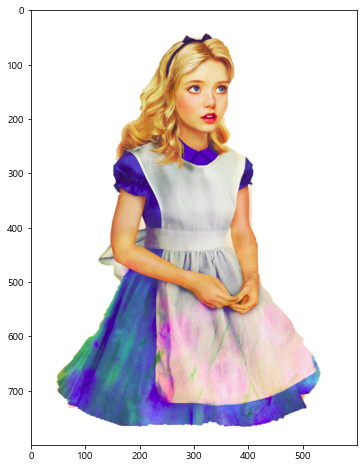

In [168]:
alice_color=np.array(Image.open("data/wordcloud/alice.png"))
alice_color
plt.figure(figsize=(8,8))
plt.imshow(alice_color)

(-0.5, 599.5, 799.5, -0.5)

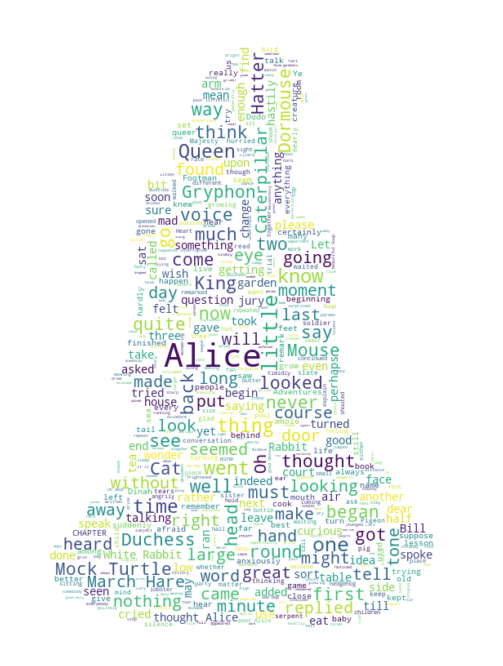

In [169]:

wordcloud = WordCloud(max_font_size=40, background_color="white", mask=alice_color, stopwords=stopwords,max_words=500).generate(text)
plt.figure(figsize=(12, 12))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")

In [9]:
from wordcloud import ImageColorGenerator
image_colors = ImageColorGenerator(alice_color)

plt.figure(figsize=(12, 12))
plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

NameError: name 'alice_color' is not defined

In [ ]:
#http://konlpy.org
# pip install konlpy

In [172]:
!pip install konlpy

  Attempting uninstall: beautifulsoup4
    Found existing installation: beautifulsoup4 4.9.1
    Uninstalling beautifulsoup4-4.9.1:
      Successfully uninstalled beautifulsoup4-4.9.1


In [18]:
from konlpy.tag import Okt
from konlpy.corpus import kolaw
import nltk
import wordcloud
from wordcloud import ImageColorGenerator

(-0.5, 399.5, 199.5, -0.5)

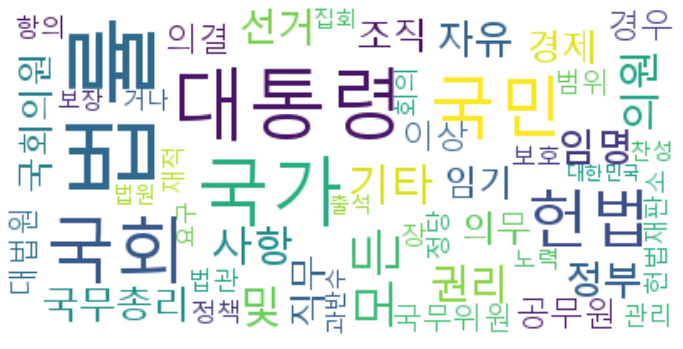

In [22]:
ko_text=kolaw.open("constitution.txt").read()
ko_text

#형태소 분석
okt = Okt()
token_ko=okt.nouns(ko_text) # 명사들만 가져오기
token_ko

# 불용어 처리 (필요없는 단어는 제외하기)
stop_words=["제", "월", "일", "조","수","때","그","이","바","잋","안","정","위","관"]
token_ko=[each_word for each_word in token_ko if each_word not in stop_words]

# 워드 카운팅 
ko = nltk.Text(token_ko)
data=ko.vocab().most_common(50)

wordcloud = WordCloud(background_color="white", 
                      font_path="C:/Windows/Fonts/malgun.ttf").generate_from_frequencies(dict(data))
plt.figure(figsize=(12, 12))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")


In [6]:
dir(ko)

['_CONTEXT_RE',
 '_COPY_TOKENS',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_context',
 '_train_default_ngram_lm',
 '_vocab',
 'collocation_list',
 'collocations',
 'common_contexts',
 'concordance',
 'concordance_list',
 'count',
 'dispersion_plot',
 'findall',
 'generate',
 'index',
 'name',
 'plot',
 'readability',
 'similar',
 'tokens',
 'vocab']